### Imports
* The ```vae``` module is imported from our package found in ```latentoptim/vae/```

In [ ]:
!pip install git+https://github.com/jhell1717/latentoptim.git

In [10]:
import random

import pickle
import torch
import numpy as np
import matplotlib.pyplot as plt

import pyga
from vae_dim import ShapeVAE
import vae
import utils

plt.rcParams['figure.figsize'] = [6, 4]

In [2]:
path = r'/Users/joshuahellewell/Desktop/02-msc/01-modules/MSc Project - 771952/03-results/data/shapes100k.pkl'

In [3]:
with open(path,'rb') as f:
    shapes = pickle.load(f)

random_indexes = random.sample(range(len(shapes)), 1000)

# Use those indexes to get the corresponding objects
random_subset = [utils.ShapeOrig(shapes[i].points.flatten()) for i in random_indexes]

## Genetic Algorithm in the Original Dimensional Space
* No latent space representation provided.
* Shapes are defined simply by the coordinates (e.g., 200 points in x,y)
* A random population of points is generated for a specified resolution.
* ```ShapeOrig``` class object is defined for each of the random shapes generated.
* ```population_size``` specifies the number of random generated shapes for the initial popualation

In [4]:
population_size = 50 
individuals = [utils.ShapeOrig(np.random.uniform(-1, 1, size=200)) for _ in range(population_size)]
population = pyga.Population(individuals) # Create initial population for GA

In [ ]:
# population_size = 100
# individuals = [ShapeOrig(np.random.normal(loc=0.0, scale=1.0, size=10)) for _ in range(population_size)]

**Inital Population**
* Before allowing the genetic algorithm to run, the initial population is simply a random selection of node coordinates in 2D space.
* The genetic algorithm will compute the fitness, that is the compactness of each shape in the initial population and perform crossover and mutation to evolve towards an optimal compactness value by adjusting the design to maximise the fitness score.

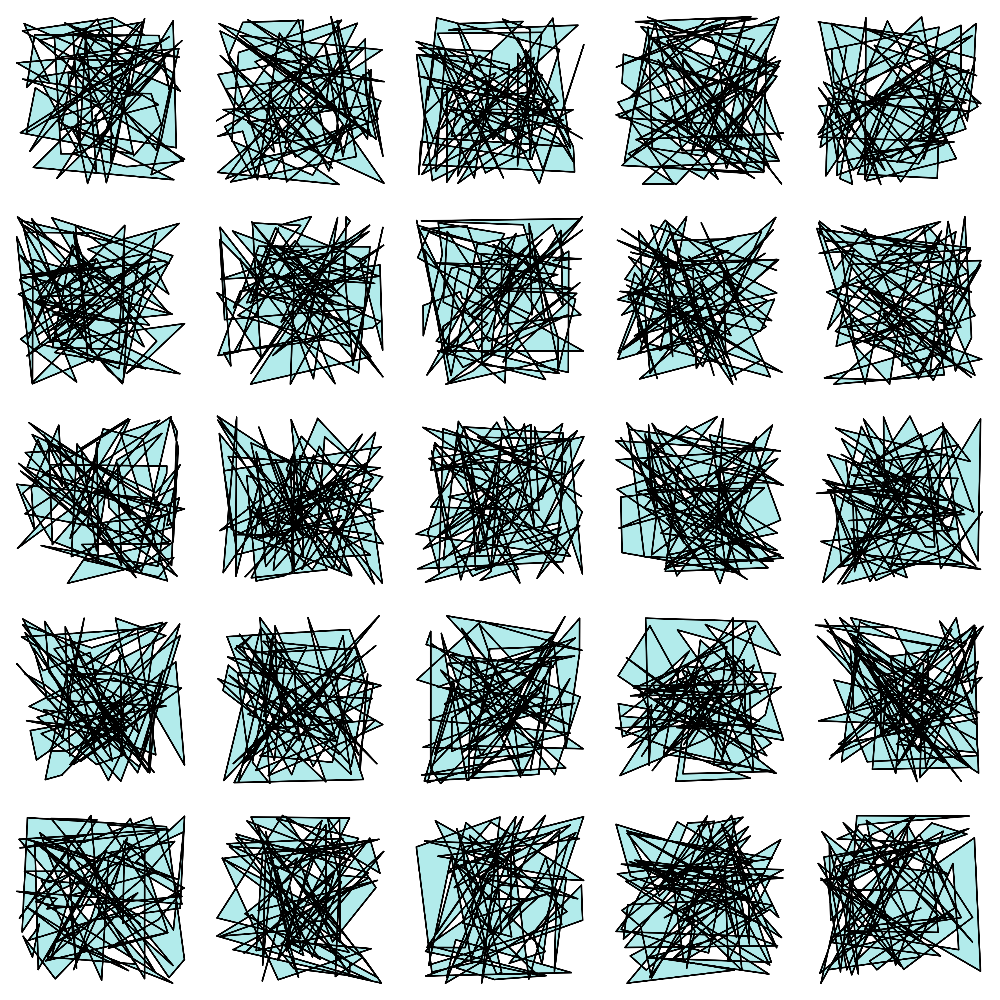

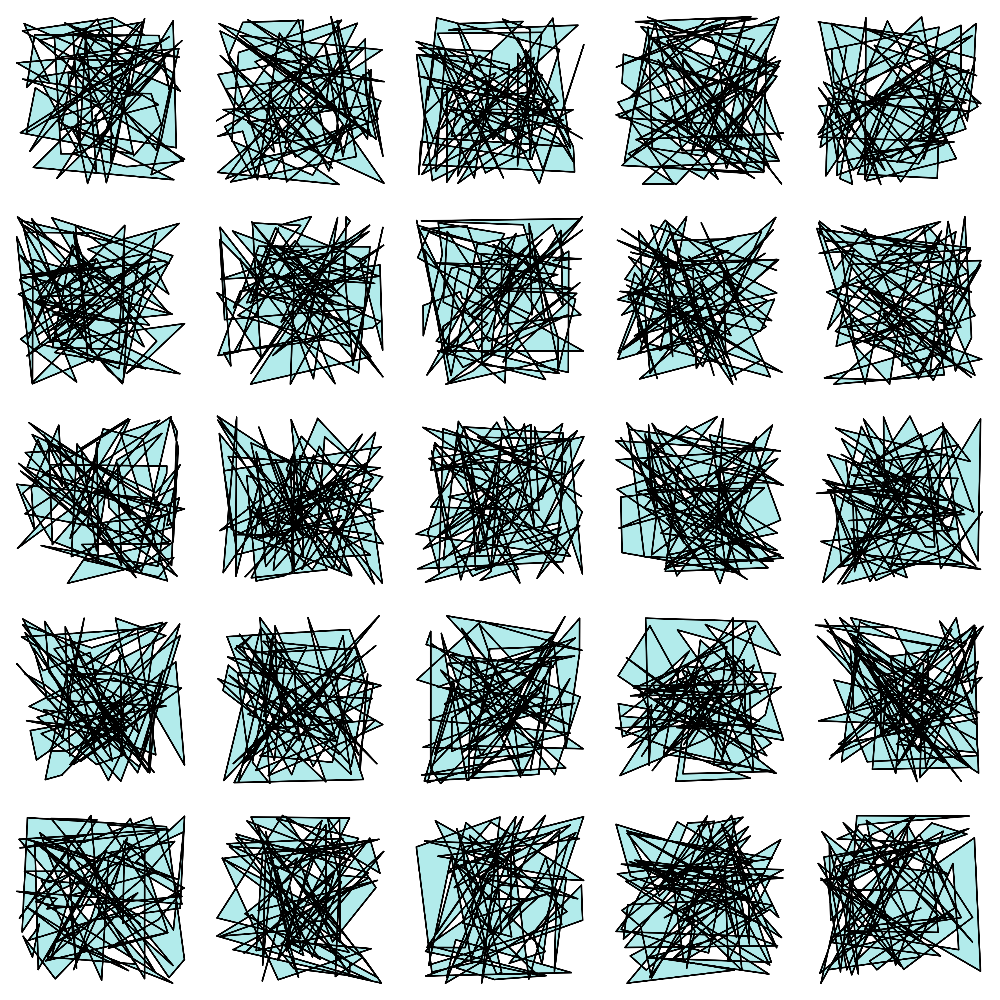

In [5]:
population.plot()

**Genetic Algorithm Setup**
* Number of generations = 1000. (i.e., the number of times a population is allowed to evolve)
* Number of parents - the number of indvidiual selected for to be evolved into the next generation.
* Mutation probability - the % chance of a gene in each individual to be randomly mutated. This helps to explore beyond the original population selection.

In [ ]:
ga = pyga.GeneticAlgorithm(population, 
                           num_generations=1000, 
                           num_parents=10, 
                           mutation_probability=0.05, 
                           animate=False)

In [ ]:
ga.evolve() # Run the GA

**Fitness**
* The maximum fitness of all shapes in the population after each generation is determined and plotted over the evolutions of the GA optimisations.


In [ ]:
ga.plot_fitness()
plt.title(f'Final Fitness Score = {ga.fitness[-1]:.3f}')
plt.tight_layout()

**Optimised Shape Design**
* The final population is visualised after the GA has run.
* The ideal shape for compactness should somewhat resemble a circle, however, factors such as initial design space complexity, number of initial individuals, number of generations will effect the success of the final population in meeting the fitness objective.

In [ ]:
population.plot()

## Genetic Algorithm in the Reduced Dimension Latent Space

**VAE Model**
* Load an existing, trained VAE model for representing shapes in low-dimensional latent form - path to trained VAE model is saved as ```model_path```
* The trained VAE can be used to decode low-dimensional latent vectors into high-dimensional 200 node shapes.
* The ```ShapeVAE.set_model()``` will assign the loaded, trained VAE model

In [103]:
model_path = r'/Users/joshuahellewell/Desktop/02-msc/01-modules/MSc Project - 771952/03-results/models/06052025_training/model_002/vae_epoch_1000_mse1015.6.pt'
model = torch.load(model_path)
utils.ShapeVAE.set_model(model)

/var/folders/g6/cp4y9yrj70746qd9t6j1yj2r0000gn/T/ipykernel_81868/559061192.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path)


**Existing Shape Data**
* As part of the VAE trained, 100k shapes were generated with resolution of 200 points.
* The shapes are saved as a .pickle file, and are access below as a list of class objects.

In [56]:
with open(path,'rb') as f:
    shapes = pickle.load(f)

random_indexes = random.sample(range(len(shapes)), 200)

# Use those indexes to get the corresponding objects
random_subset = [ShapeVAE(shapes[i].points.flatten(),model) for i in random_indexes]

sh = [torch.tensor(shape.genes, dtype = torch.float32).view(-1) for shape in random_subset]

**Random Latent Shape Generation**
* Using the distribution of latent values, create a set of random latent values to reconstruct high-dimensional shapes.
* We sample shapes with latent values between -3 and +3

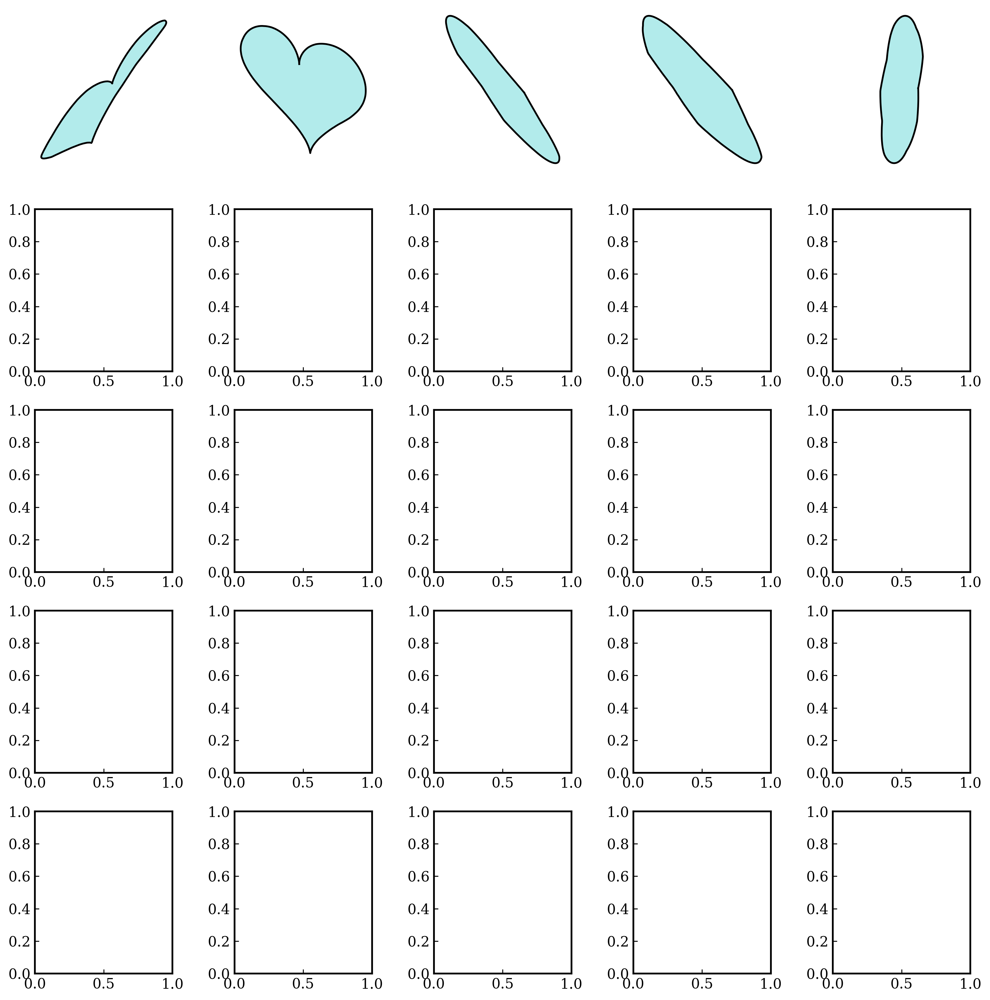

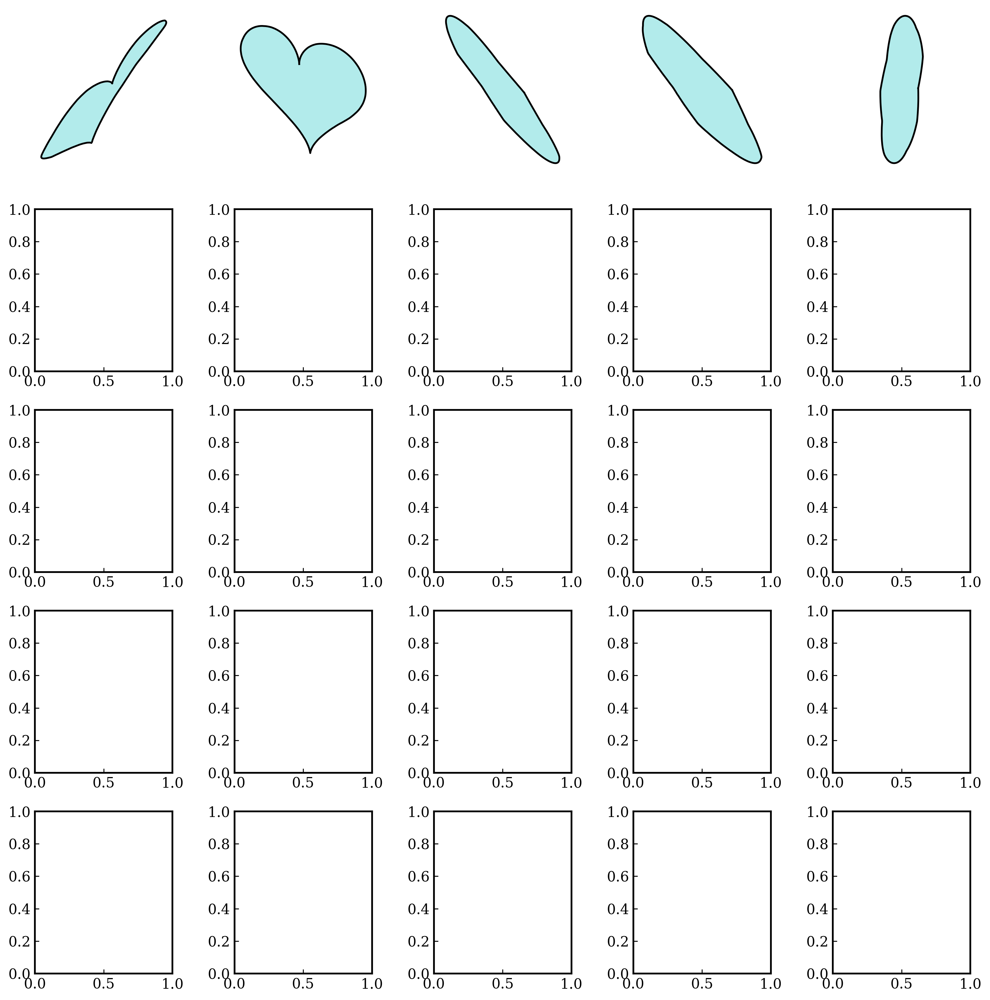

In [105]:
population_size = 5 # GA initial population size. 

individuals = [utils.ShapeVAE(np.random.uniform(-3, 3, size=3)) for _ in range(population_size)] # Sample from random distribution.

population = pyga.Population(individuals) # Create population with generated individuals.

population.plot() # View samples of initial population

In [110]:
population.evaluate()
population.fitness

[np.float32(0.022779258),
 np.float32(0.05104937),
 np.float32(0.030891348),
 np.float32(0.04113965),
 np.float32(0.044246506)]

In [88]:
ga = pyga.GeneticAlgorithm(population, 
                           num_generations=1000, 
                           num_parents=20, 
                           mutation_probability=0.5, 
                           animate=False)

In [89]:
ga.evolve()

Evolution: 100%|██████████| 1000/1000 [00:00<00:00, 2436.29it/s]


In [ ]:
ga.plot_fitness()
plt.title(f'Final Fitness Score = {ga.fitness[-1]:.3f}')
plt.tight_layout()

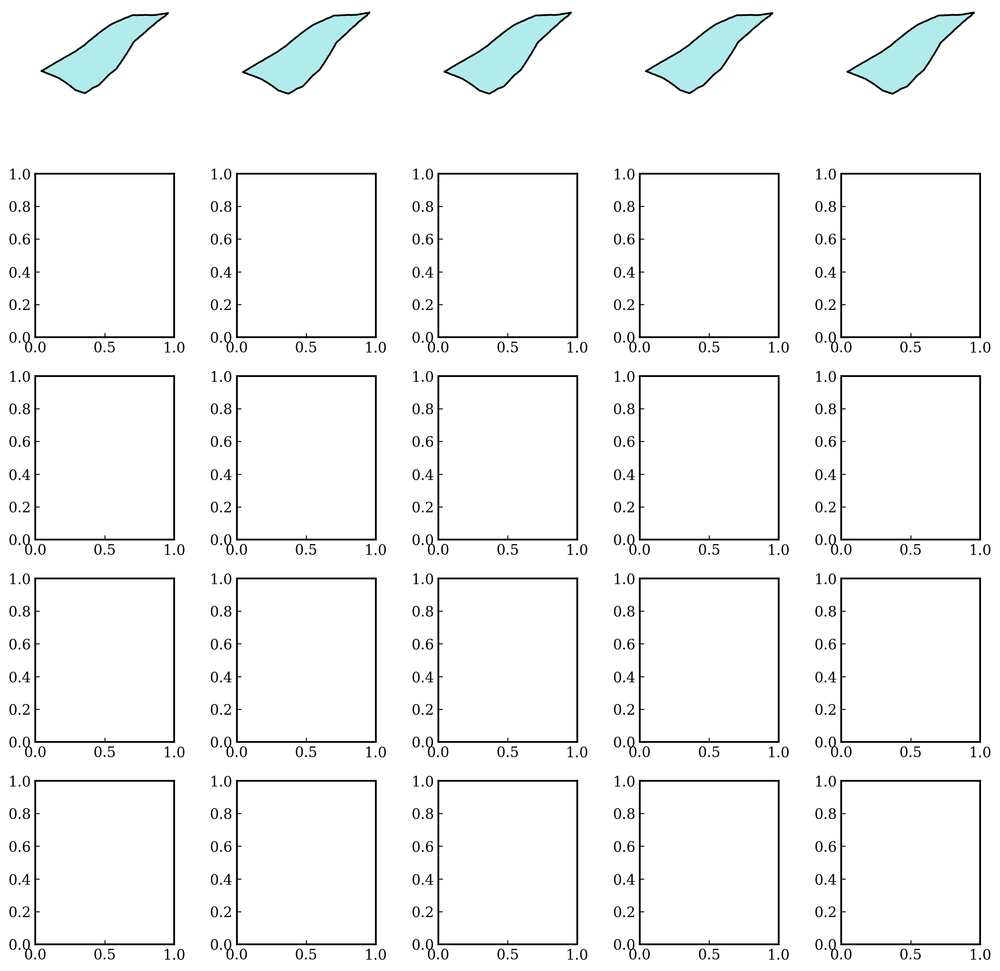

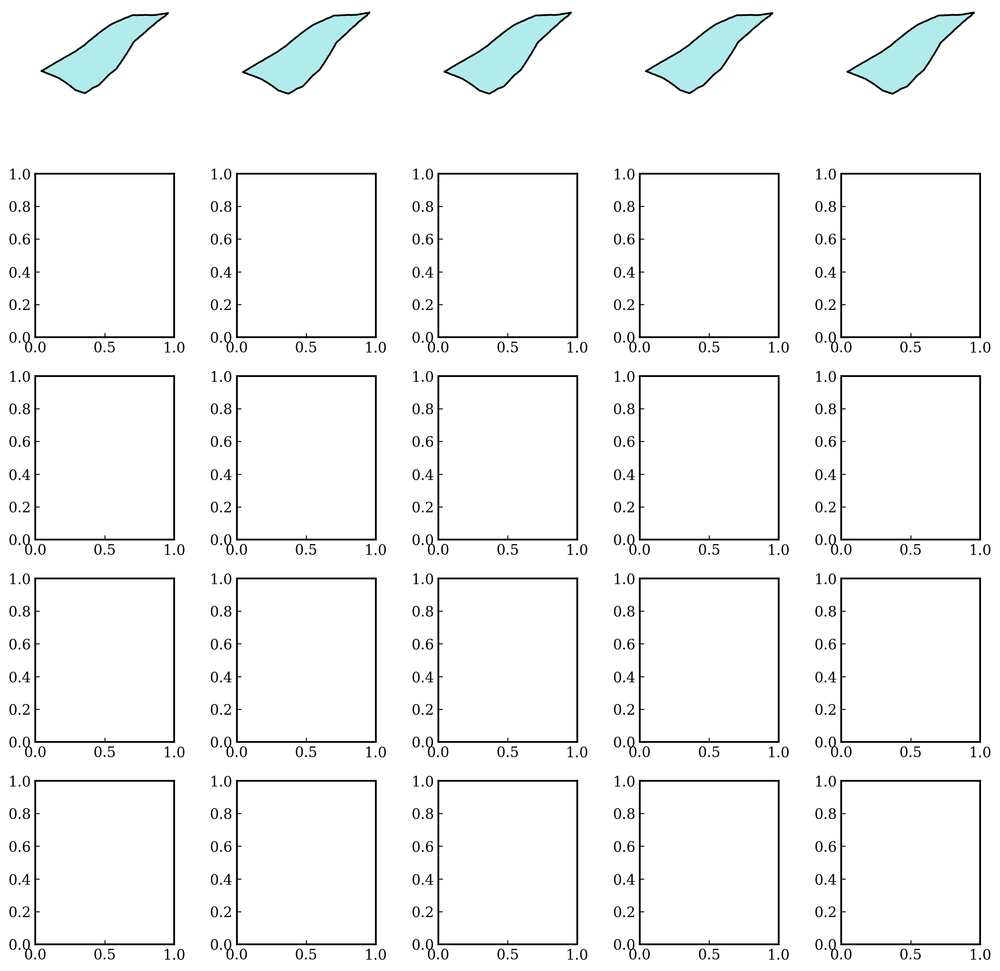

In [90]:
population.plot()

### Consistent shape set between VAE & Original
* We convert the randomly sampled shapes from the latent representation into the 200 node representation.
* Applying the GA in this represenation reveals a loss of performance and effectiveness in converging towards an optimal fitness.

In [112]:
sh = [utils.ShapeOrig(model.decoder(torch.tensor(shape.genes,dtype=torch.float32)).detach().numpy()) for shape in individuals]
population = pyga.Population(sh)

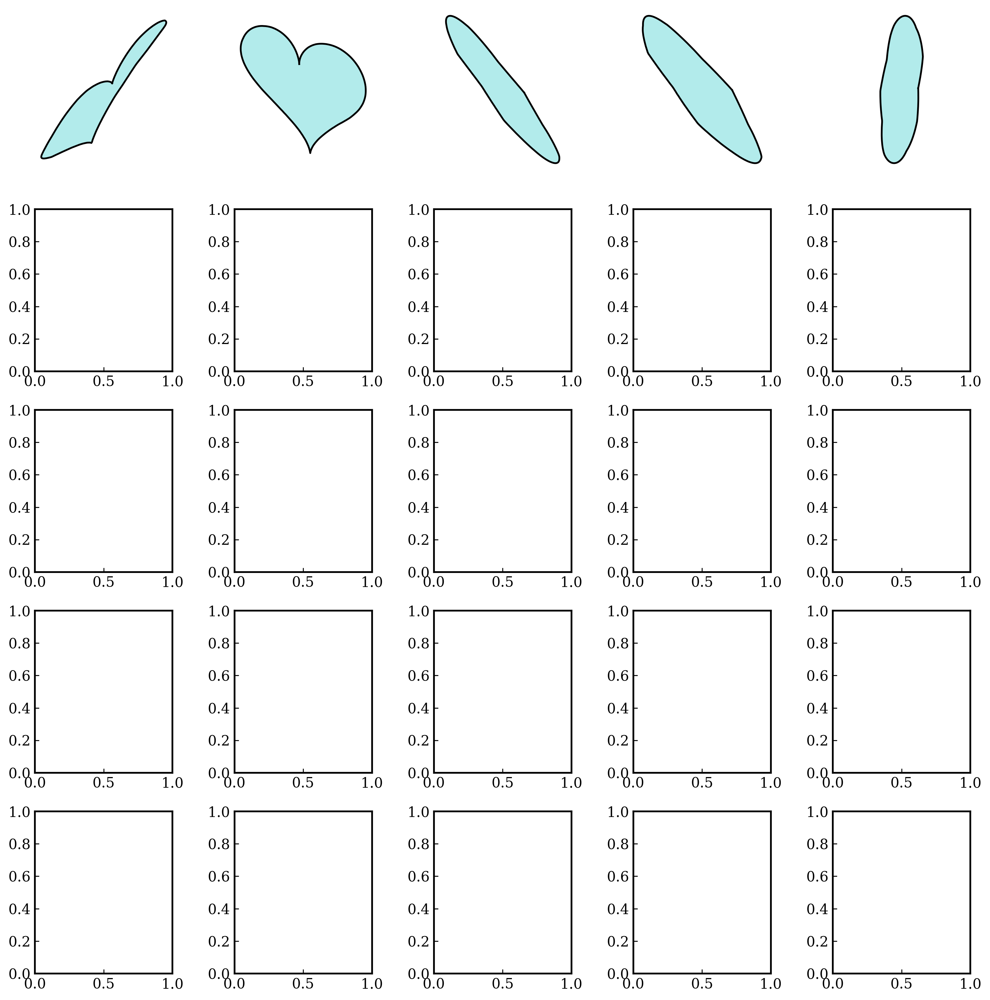

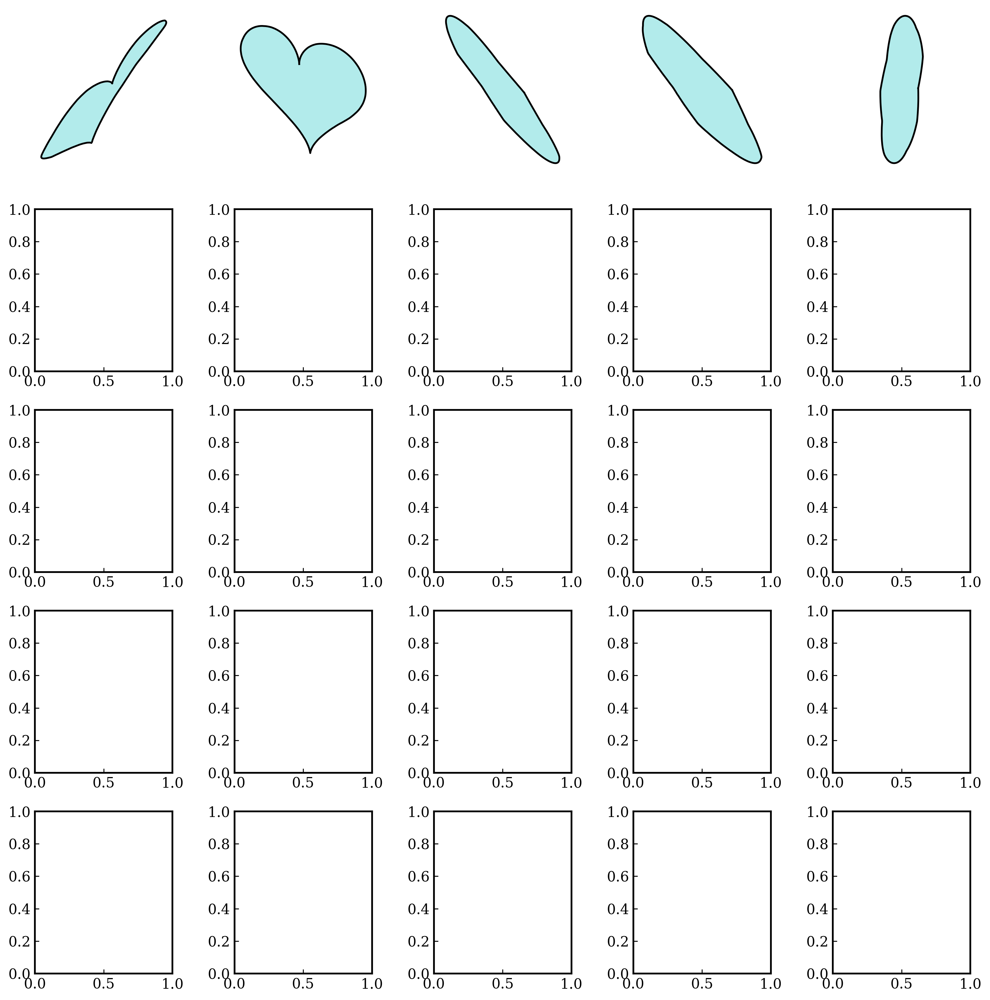

In [114]:
population.plot()

In [115]:
ga = pyga.GeneticAlgorithm(population, 
                           num_generations=1000, 
                           num_parents=20, 
                           mutation_probability=0.05, 
                           animate=False)

In [116]:
ga.evolve()
print(ga.fitness[-1])

Evolution: 100%|██████████| 1000/1000 [00:03<00:00, 324.36it/s]

5.9140424e-05


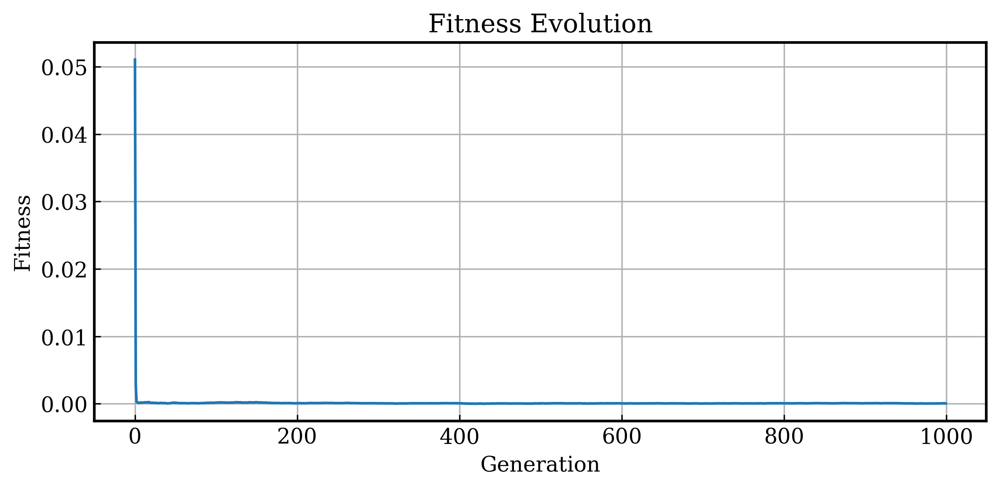

In [117]:
ga.plot_fitness()

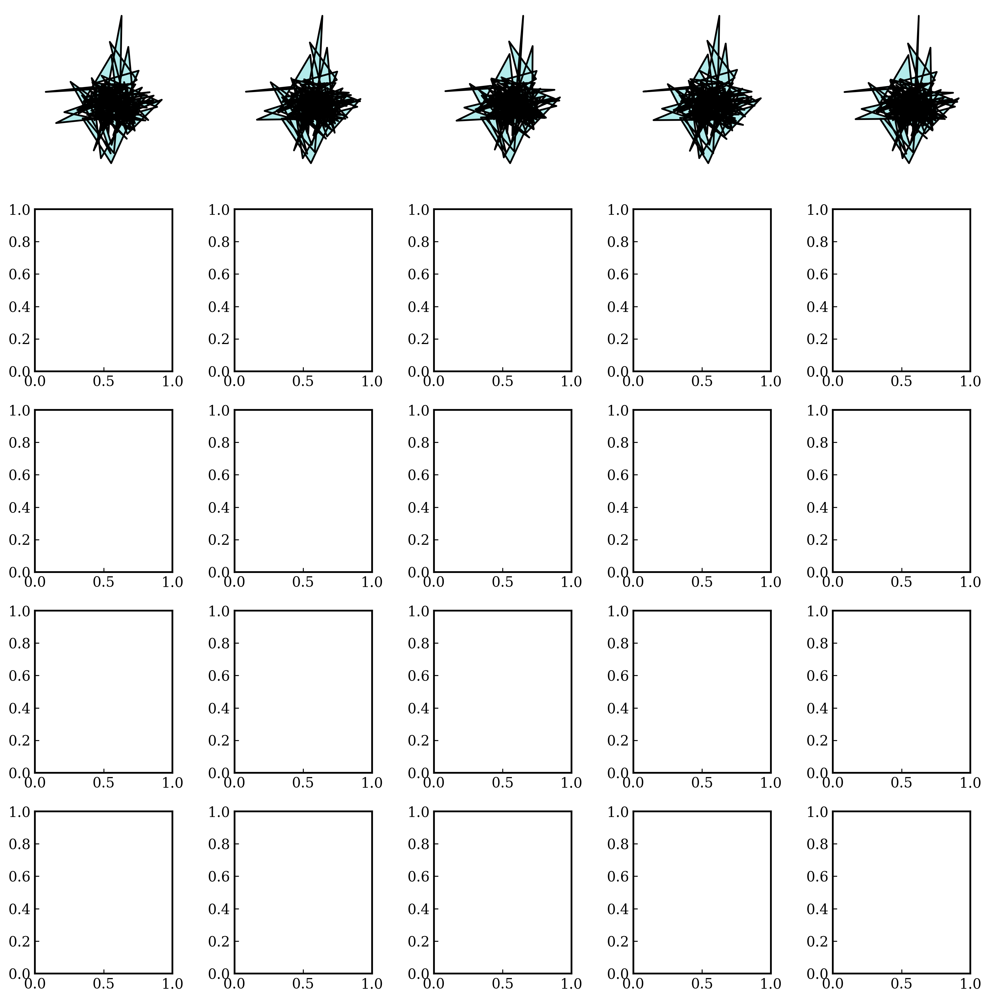

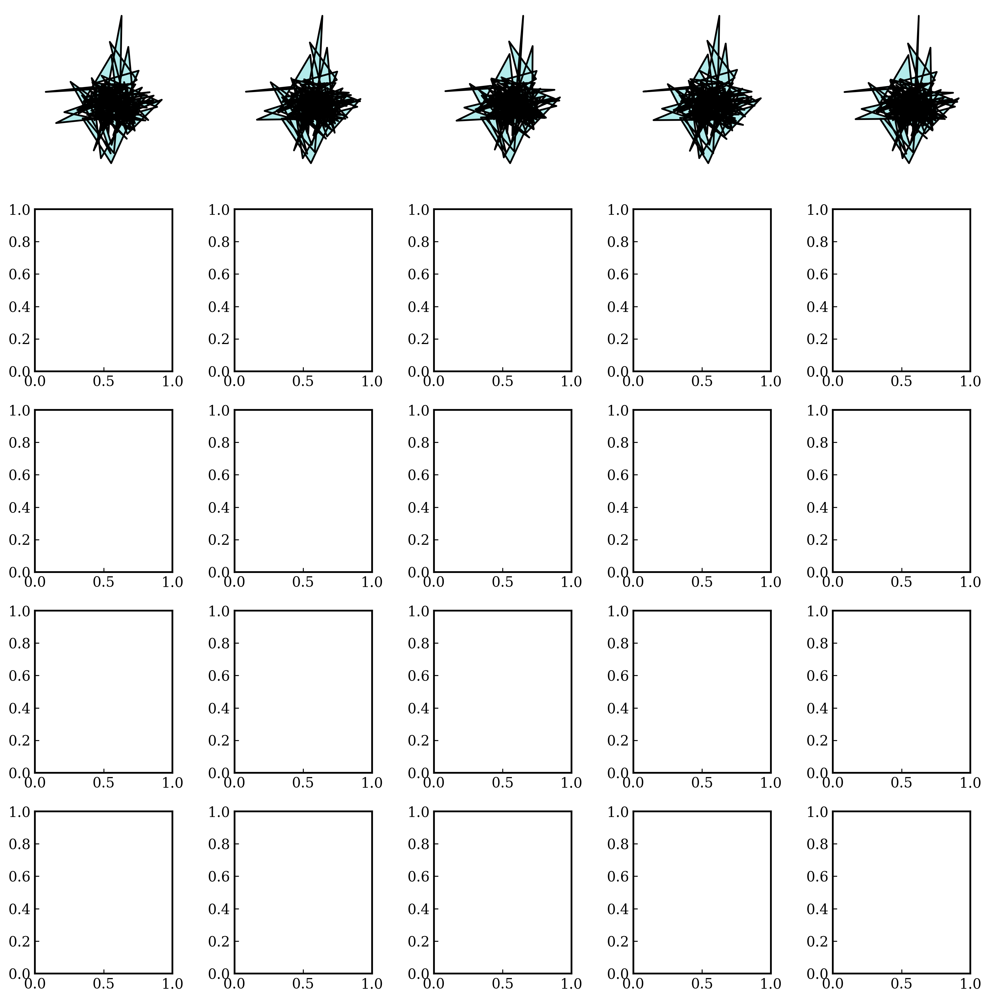

In [118]:
population.plot()

## Closed Noisy Ring
* Sometimes, in engineering, we may have have previous design knowledge that directs the design in a certain way.
* For example, rather than starting from a random combination of nodes, we may apply the constraint that the nodes of a 2D shape loosely follow a ring.
* This example shows the generation of a random set of shapes defined as 200 nodes, around a centre pont with noise added.

In [119]:
num_shapes = 50
shapes = np.array([utils.ShapeOrig.generate_closed_noisy_shape() for _ in range(num_shapes)])  # Shape: (100, 200, 2)

In [120]:
individuals = [utils.ShapeOrig(i.flatten()) for i in shapes]
population = pyga.Population(individuals)

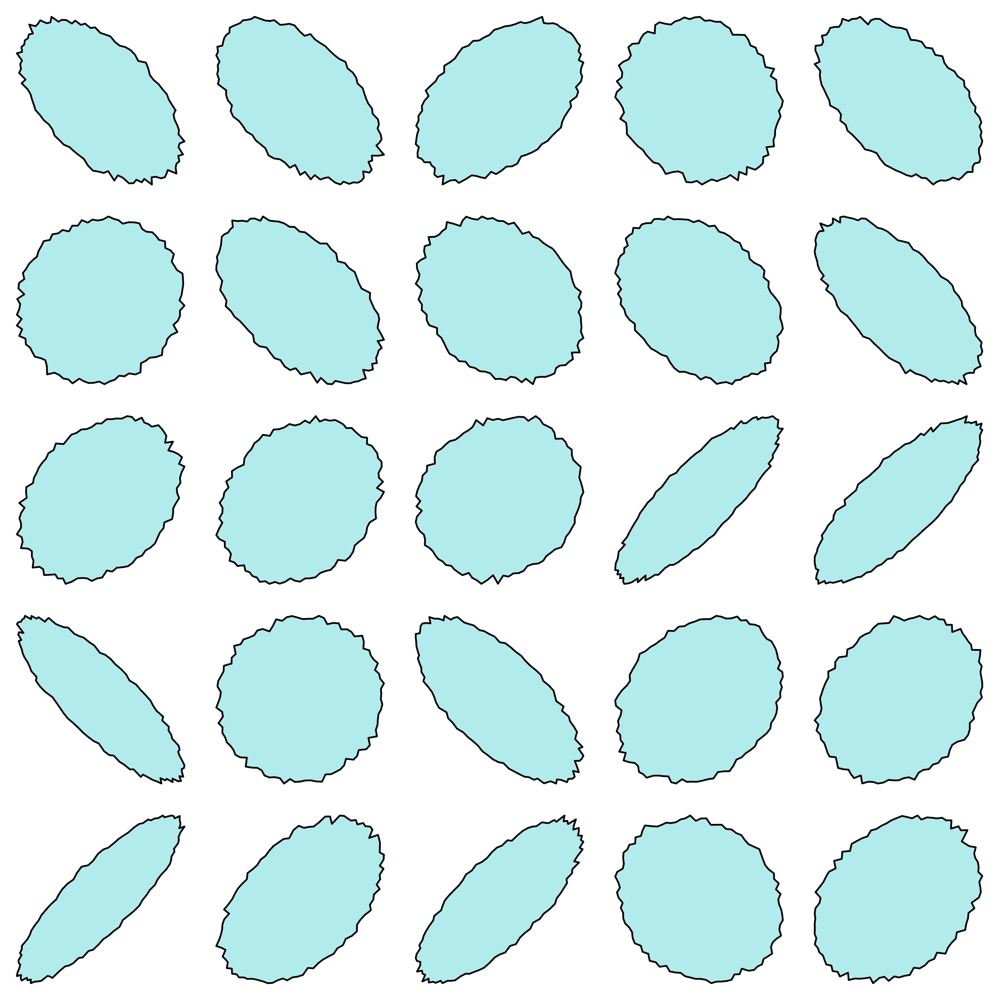

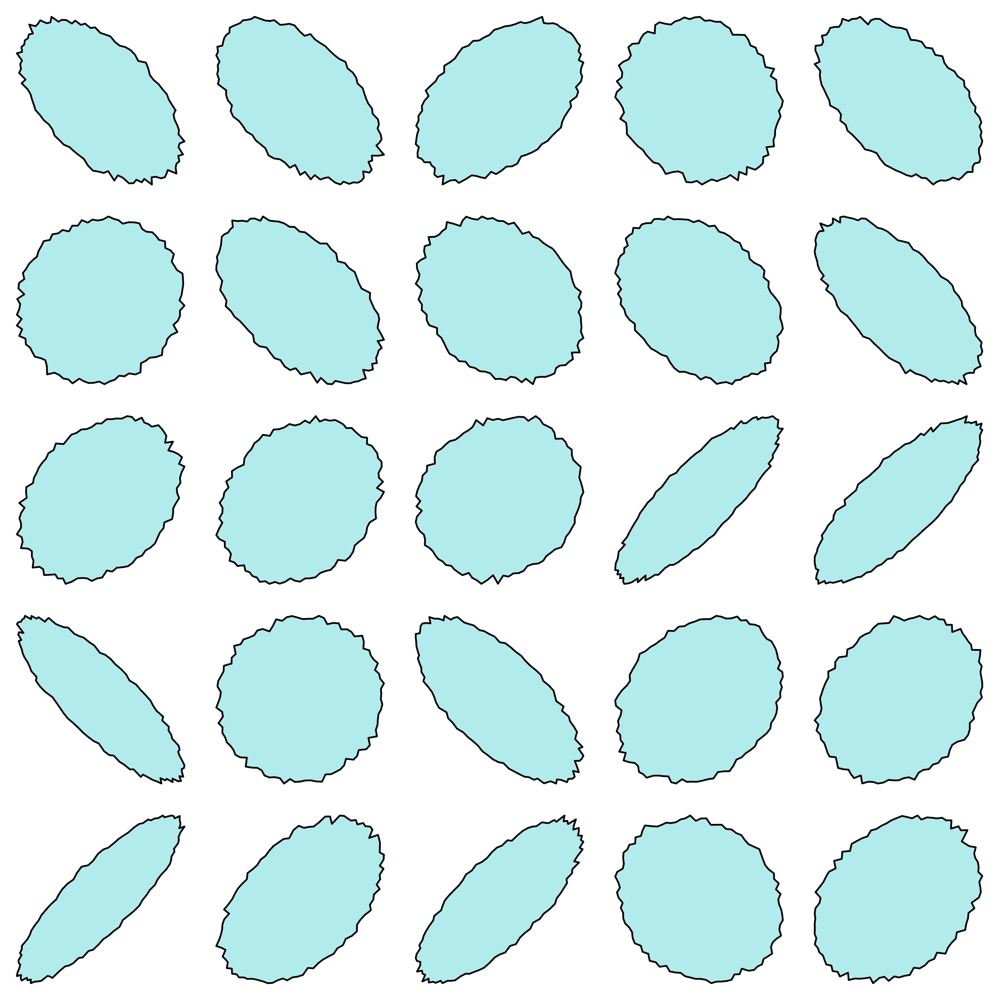

In [121]:
population.plot()

In [123]:
ga = pyga.GeneticAlgorithm(population, 
                           num_generations=1000, 
                           num_parents=10, 
                           mutation_probability=0.05, 
                           animate=False)

In [124]:
ga.evolve()

Evolution: 100%|██████████| 1000/1000 [00:14<00:00, 68.96it/s]


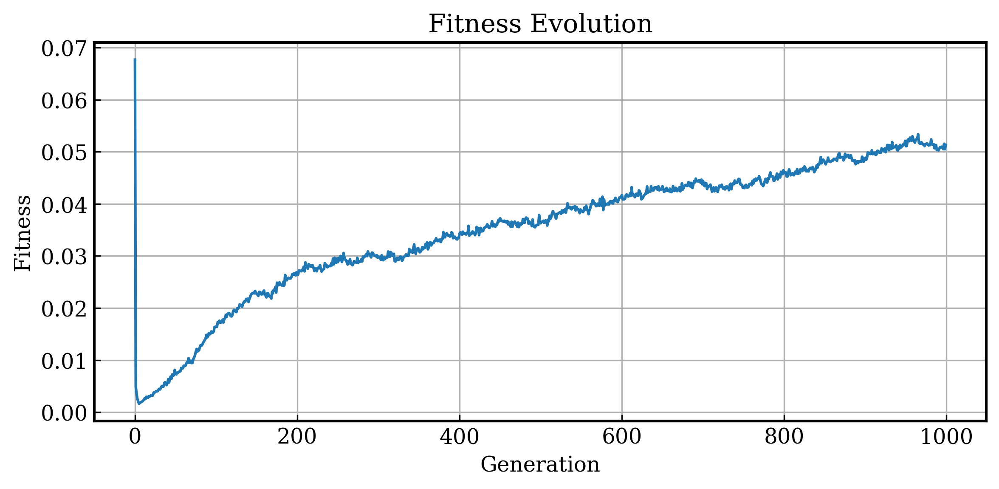

In [125]:
ga.plot_fitness()

### Test all VAE Models:

In [141]:
all_models = [r'/Users/joshuahellewell/Desktop/02-msc/01-modules/MSc Project - 771952/03-results/models/06052025_training/model_001/vae_epoch_1000_mse1145.3.pt',
              r'/Users/joshuahellewell/Desktop/02-msc/01-modules/MSc Project - 771952/03-results/models/06052025_training/model_002/vae_epoch_1000_mse1015.6.pt',
              r'/Users/joshuahellewell/Desktop/02-msc/01-modules/MSc Project - 771952/03-results/models/06052025_training/model_003/vae_epoch_1000_mse1030.7.pt',
              r'/Users/joshuahellewell/Desktop/02-msc/01-modules/MSc Project - 771952/03-results/models/06052025_training/model_004/vae_epoch_1000_mse1207.0.pt',
              r'/Users/joshuahellewell/Desktop/02-msc/01-modules/MSc Project - 771952/03-results/models/06052025_training/model_005/vae_epoch_1000_mse1215.2.pt']

for i,j in enumerate(all_models):
    model_path = i
    model = torch.load(j)
    utils.ShapeVAE.set_model(model)

    population_size = 50 # GA initial population size. 

    individuals = [utils.ShapeVAE(np.random.uniform(-3, 3, size=i+2)) for _ in range(population_size)] # Sample from random distribution.
    population = pyga.Population(individuals) # Create population with generated individuals.

    print(f'{i+2}D Latent Model')
    # population.plot() # View samples of initial population
    ga = pyga.GeneticAlgorithm(population, 
                           num_generations=100, 
                           num_parents=10, 
                           mutation_probability=0.05, 
                           animate=False)
    
    ga.evolve()
    print(f'Final Fitness Value = {ga.fitness[-1]:.6f}')

    # ga.plot_fitness()    

    sh = [utils.ShapeOrig(model.decoder(torch.tensor(shape.genes,dtype=torch.float32)).detach().numpy()) for shape in individuals]
    population = pyga.Population(sh)

    ga = pyga.GeneticAlgorithm(population, 
                           num_generations=1000, 
                           num_parents=10, 
                           mutation_probability=0.05, 
                           animate=False)
    
    ga.evolve()
    print(f'Final fitness in original space:{ga.fitness[-1]:.6f}')

/var/folders/g6/cp4y9yrj70746qd9t6j1yj2r0000gn/T/ipykernel_81868/2654290991.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(j)


2D Latent Model


Evolution: 100%|██████████| 100/100 [00:00<00:00, 228.39it/s]


Final Fitness Value = 0.078525


Evolution: 100%|██████████| 1000/1000 [00:30<00:00, 32.47it/s]


Final fitness in original space:0.032901
3D Latent Model


Evolution: 100%|██████████| 100/100 [00:00<00:00, 248.43it/s]


Final Fitness Value = 0.078600


Evolution: 100%|██████████| 1000/1000 [00:30<00:00, 32.45it/s]


Final fitness in original space:0.030910
4D Latent Model


Evolution: 100%|██████████| 100/100 [00:00<00:00, 243.31it/s]


Final Fitness Value = 0.079490


Evolution: 100%|██████████| 1000/1000 [00:31<00:00, 31.88it/s]


Final fitness in original space:0.029022
5D Latent Model


Evolution: 100%|██████████| 100/100 [00:00<00:00, 222.57it/s]


Final Fitness Value = 0.079399


Evolution: 100%|██████████| 1000/1000 [00:31<00:00, 32.16it/s]


Final fitness in original space:0.034260
6D Latent Model


Evolution: 100%|██████████| 100/100 [00:00<00:00, 229.15it/s]


Final Fitness Value = 0.079464


Evolution: 100%|██████████| 1000/1000 [00:31<00:00, 32.15it/s]

Final fitness in original space:0.028299


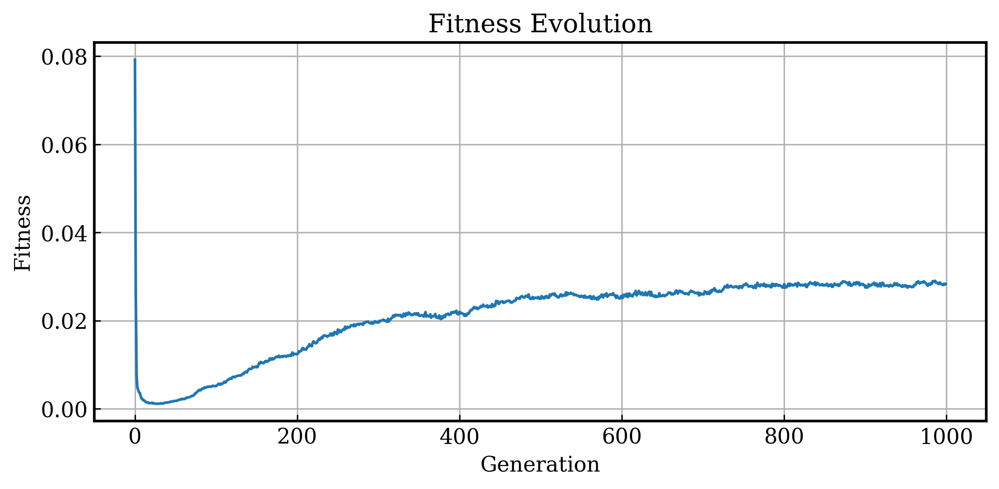

In [143]:
ga.plot_fitness()